<a href="https://colab.research.google.com/github/Matsumo-chi/Grape-Grain-Detection-Dataset/blob/main/Detectron2GrapesCount_diff.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# 上記のpytorchのバージョンに合ったdetectron2をインストールします。
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# 指定されたtorch + CUDAバージョンにマッチするdetectron2のリリースがまだない場合は、別のpytorchをインストールする必要があります。

exit(0)  # インストール後、Colabで "restart runtime "が必要になることがあります。この行でもランタイムを再起動できます

In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

このセクションでは、既存のdetectron2モデルを、新しいフォーマットのカスタムデータセットで学習する方法を紹介します。

ここでは、[バルーンセグメンテーションデータセット](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)を使用します。
を使います。
ここでは、detectron2のmodel zooにあるCOCOデータセットで事前に学習された既存のモデルから、バルーンセグメンテーションモデルを学習します。

COCOデータセットには "balloon "というカテゴリがないことに注意してください。この新しいクラスを数分で認識できるようにします。

## データセットの準備

detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html)に従って、detectron2にバルーンデータセットを登録します。
ここでは、データセットが独自の形式であるため、それを解析してdetectron2の標準形式に整える関数を書いています。カスタムフォーマットのデータセットを使うときは、このような関数を書く必要があります。詳しくは、チュートリアルをご覧ください。


In [3]:
# download, decompress the data
!wget https://github.com/Matsumo-chi/BerryCounting/blob/main/images-diff.zip?raw=true -q -O images-diff.zip
!unzip images-diff.zip > /dev/null

In [4]:
# データセットがCOCOフォーマットの場合、このセルは以下の3行で置き換えることができます。
from detectron2.data.datasets import register_coco_instances
register_coco_instances("grapes_dataset_train", {}, "images-diff/json_annotation_train.json", "images-diff/train")
register_coco_instances("grapes_dataset_val", {}, "images-diff/json_annotation_val.json", "images-diff/val")
grapes_metadata = MetadataCatalog.get("grapes_dataset_train")
dataset_dicts = DatasetCatalog.get("grapes_dataset_train")

[03/02 10:04:31 d2.data.datasets.coco]: Loaded 45 images in COCO format from images-diff/json_annotation_train.json


データの読み込みが正しいことを確認するために、トレーニングセットの中からランダムに選んだサンプルのアノテーションを可視化してみましょう。



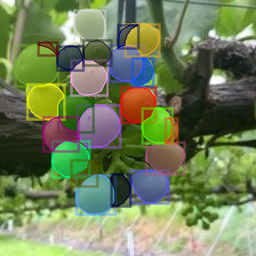

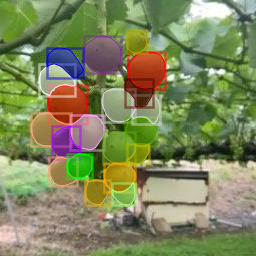

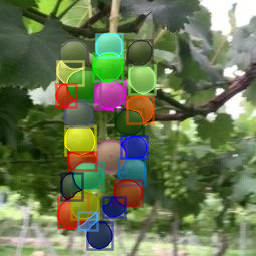

In [5]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=grapes_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train!

それでは、COCOでトレーニングしたR50-FPN Mask R-CNNモデルを風船データセットで微調整してみましょう。P100 GPUで300イテレーションのトレーニングを行うのに約2分かかります。


In [6]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("grapes_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # モデルzooからトレーニングを初期化させる
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0002  # 厳選されたLR　0.00025
cfg.SOLVER.MAX_ITER = 1500    # このおもちゃのデータセットでは300回の反復で十分だと思いますが、実用的なデータセットではもっと長い時間訓練する必要があります。
cfg.SOLVER.STEPS = []        # do not decay 学習率
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # の方が高速で、このトイデータセットには十分な性能を持っています（デフォルト：512）
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# 注：この設定はクラスの数を意味しますが、いくつかの人気のある非公式チュートリアルでは、num_classes+1をここで使用しています。

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/02 10:05:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:03, 50.0MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[03/02 10:05:44 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/02 10:06:10 d2.utils.events]:  eta: 0:32:12  iter: 19  total_loss: 3  loss_cls: 0.6893  loss_box_reg: 0.7537  loss_mask: 0.6896  loss_rpn_cls: 0.7307  loss_rpn_loc: 0.1055  time: 1.2894  data_time: 0.0185  lr: 3.9962e-06  max_mem: 2258M
[03/02 10:06:36 d2.utils.events]:  eta: 0:31:49  iter: 39  total_loss: 2.6  loss_cls: 0.6698  loss_box_reg: 0.804  loss_mask: 0.6781  loss_rpn_cls: 0.3233  loss_rpn_loc: 0.08982  time: 1.2908  data_time: 0.0108  lr: 7.9922e-06  max_mem: 2258M
[03/02 10:07:03 d2.utils.events]:  eta: 0:31:53  iter: 59  total_loss: 2.311  loss_cls: 0.6329  loss_box_reg: 0.8176  loss_mask: 0.6511  loss_rpn_cls: 0.1559  loss_rpn_loc: 0.08572  time: 1.3109  data_time: 0.0098  lr: 1.1988e-05  max_mem: 2258M
[03/02 10:07:29 d2.utils.events]:  eta: 0:31:27  iter: 79  total_loss: 2.2  loss_cls: 0.5805  loss_box_reg: 0.819  loss_mask: 0.6172  loss_rpn_cls: 0.07666  loss_rpn_loc: 0.09323  time: 1.3091  data_time: 0.0090  lr: 1.5984e-05  max_mem: 2258M
[03/02 10:07:55 d2.utils.e

In [7]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## 学習済みモデルによる推論と評価

In [8]:
# 推論はトレーニングで使用されるパラメータを持つコンフィグを使用すべきである
# cfgにはこれまでに設定した内容がすべて含まれています。推論のために少しだけ変更しました。
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # 先ほど学習したモデルへのパス
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # カスタムテスト閾値の設定
predictor = DefaultPredictor(cfg)

予測結果を視覚化します。

[03/02 10:37:59 d2.data.datasets.coco]: Loaded 12 images in COCO format from images-diff/json_annotation_val.json
images-diff/val/image_914.jpg


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


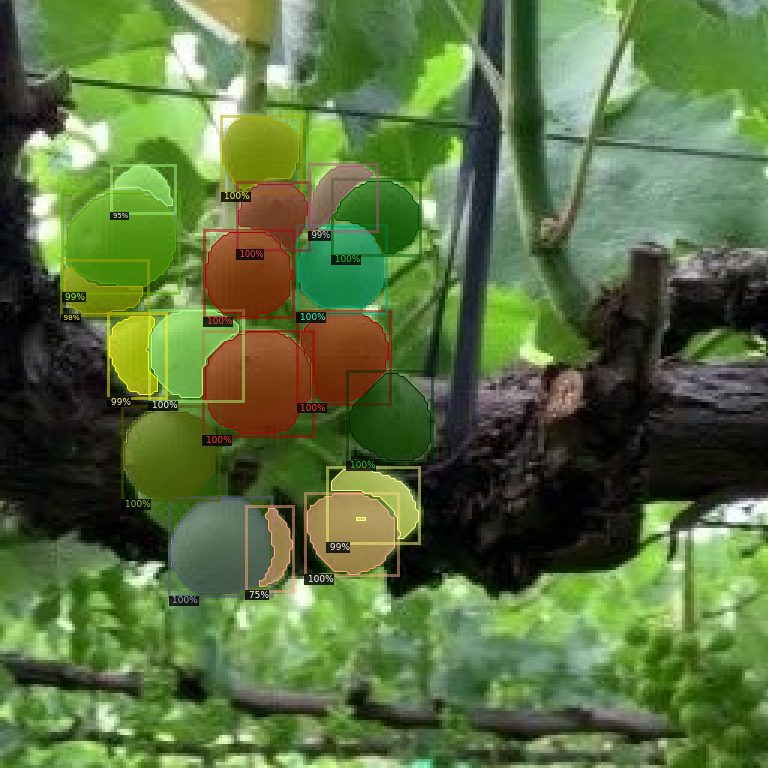

images-diff/val/image_935.jpg


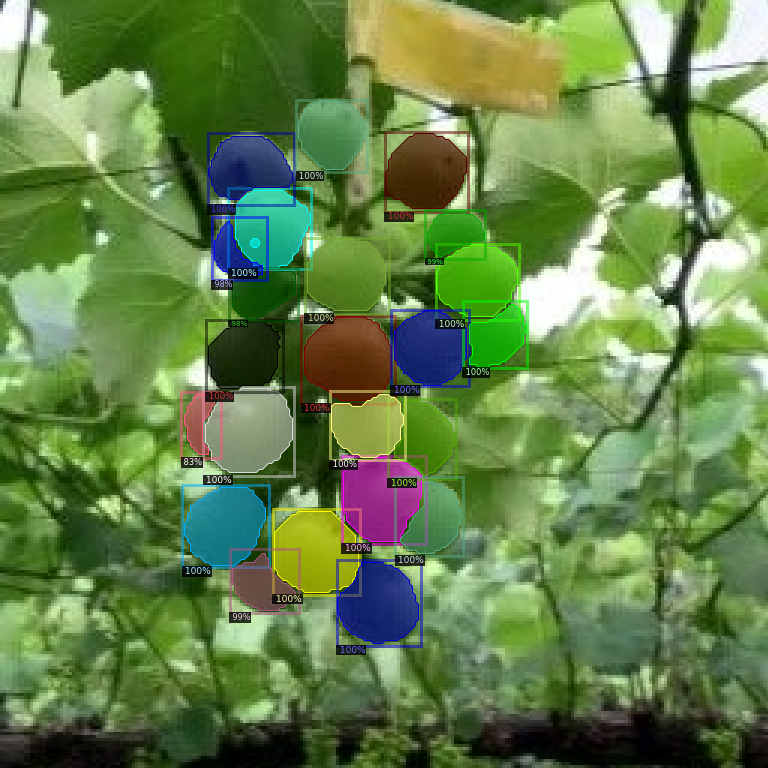

images-diff/val/image_966.jpg


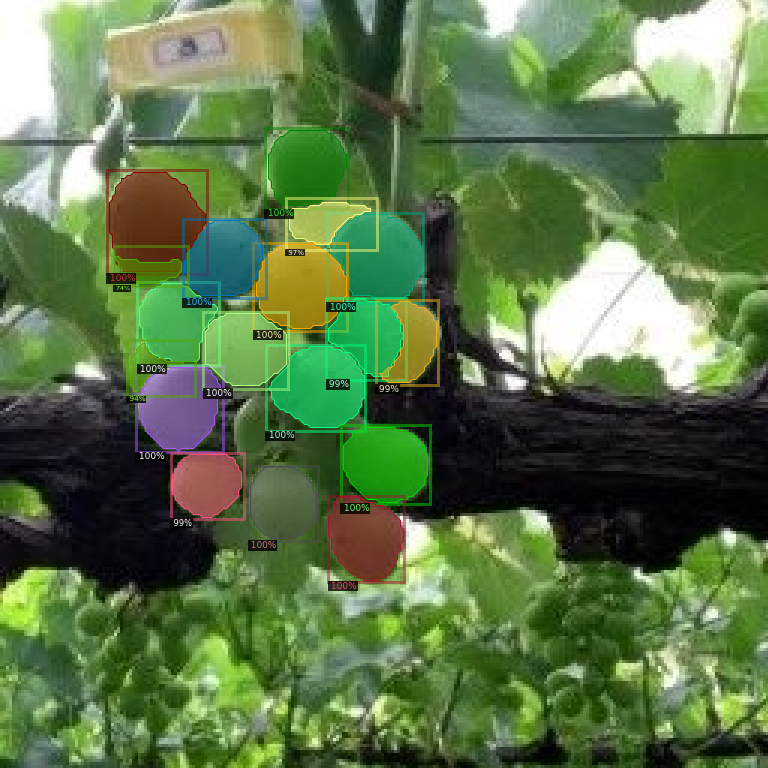

images-diff/val/image_988.jpg


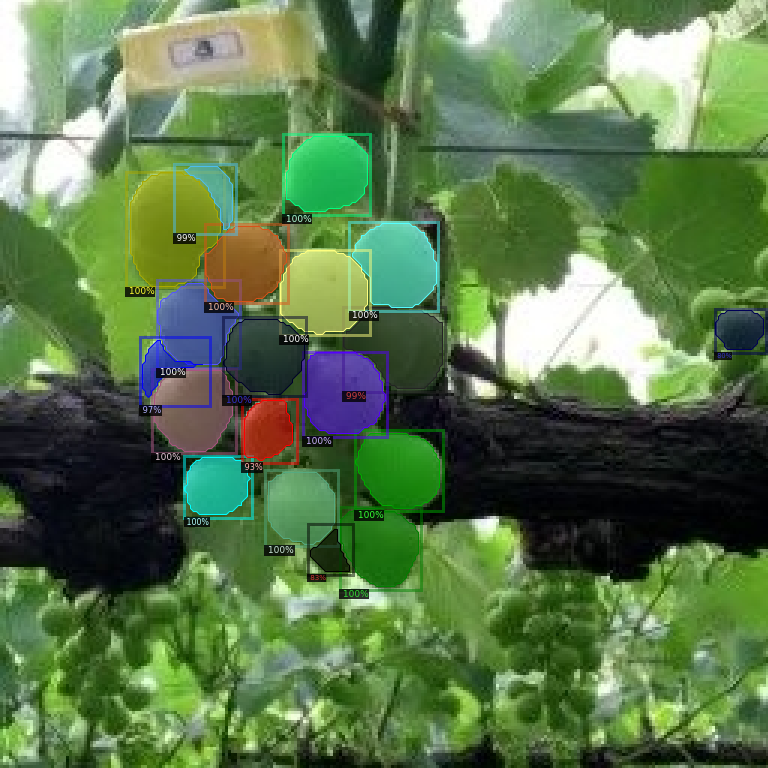

images-diff/val/image_996.jpg


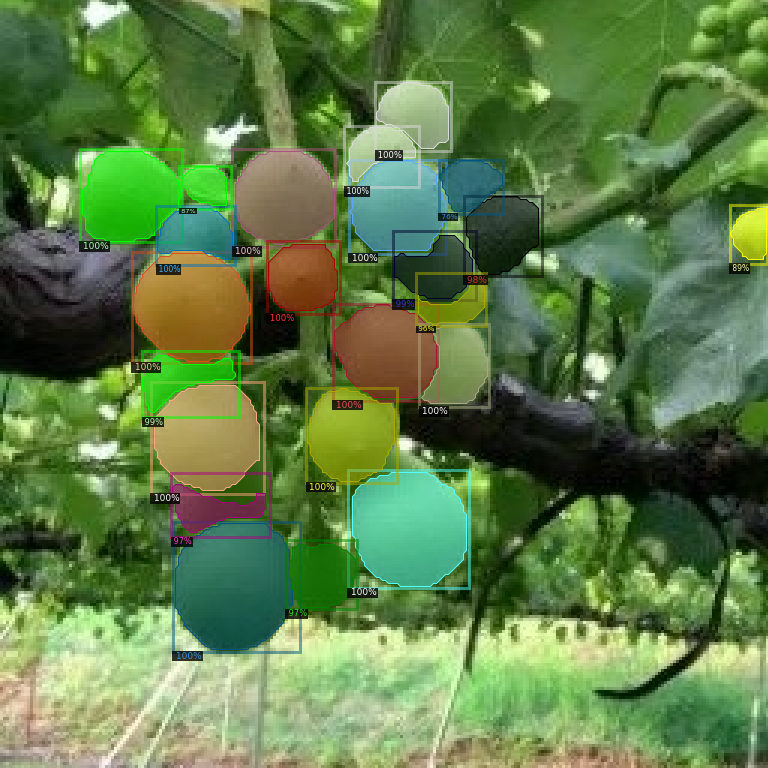

images-diff/val/image_1001.jpg


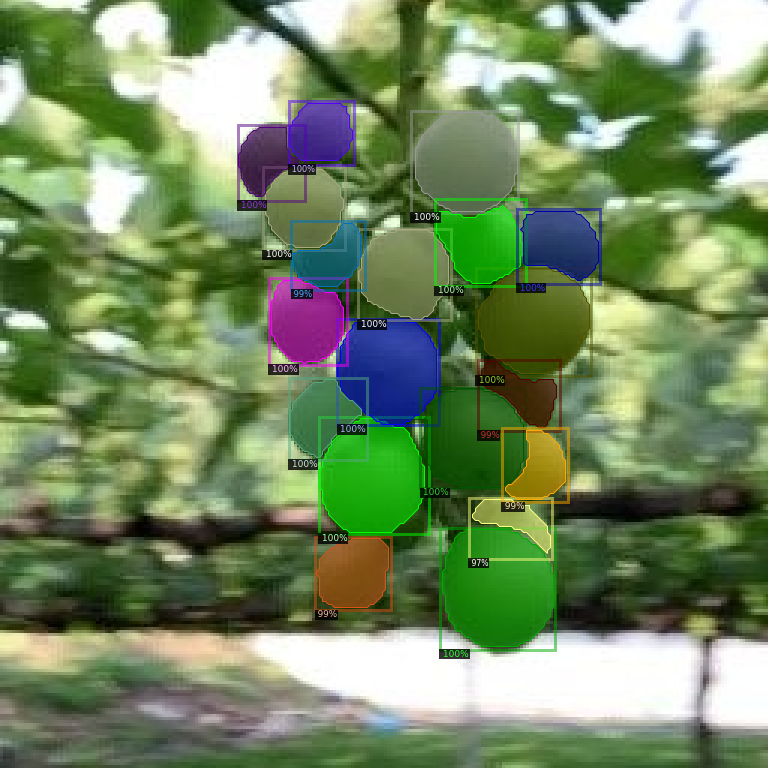

images-diff/val/image_1015.jpg


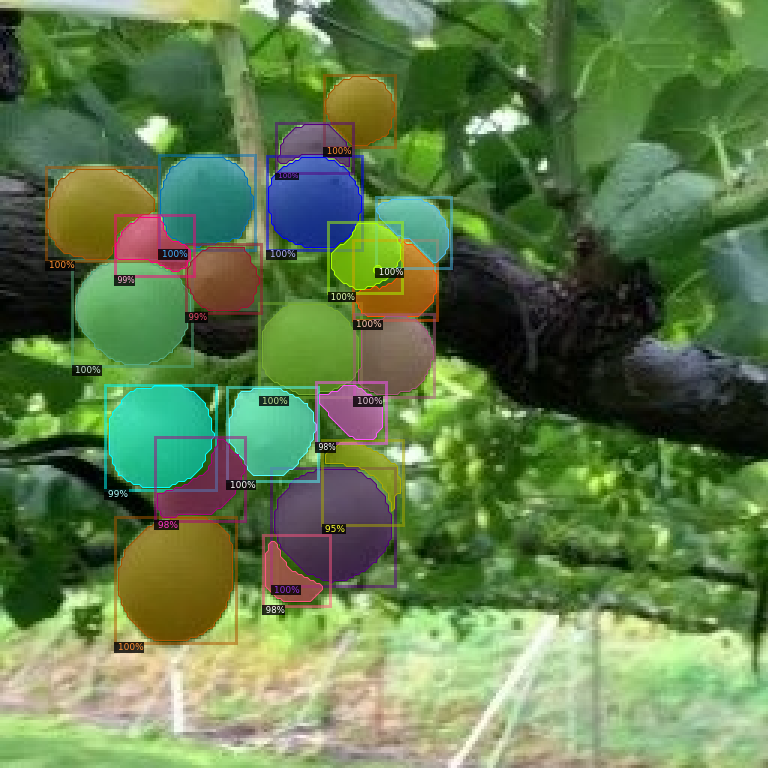

images-diff/val/image_1020.jpg


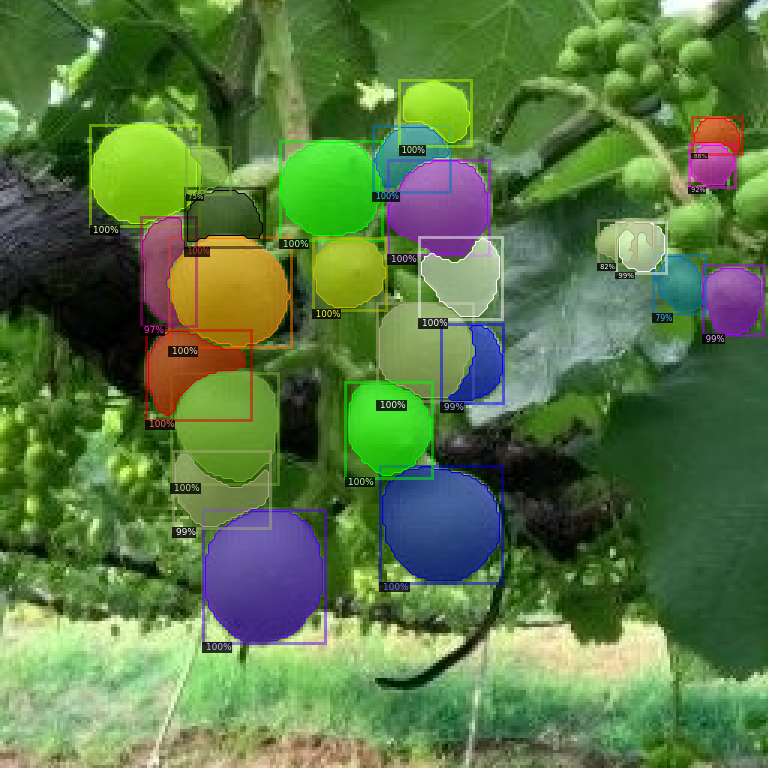

images-diff/val/image_1049.jpg


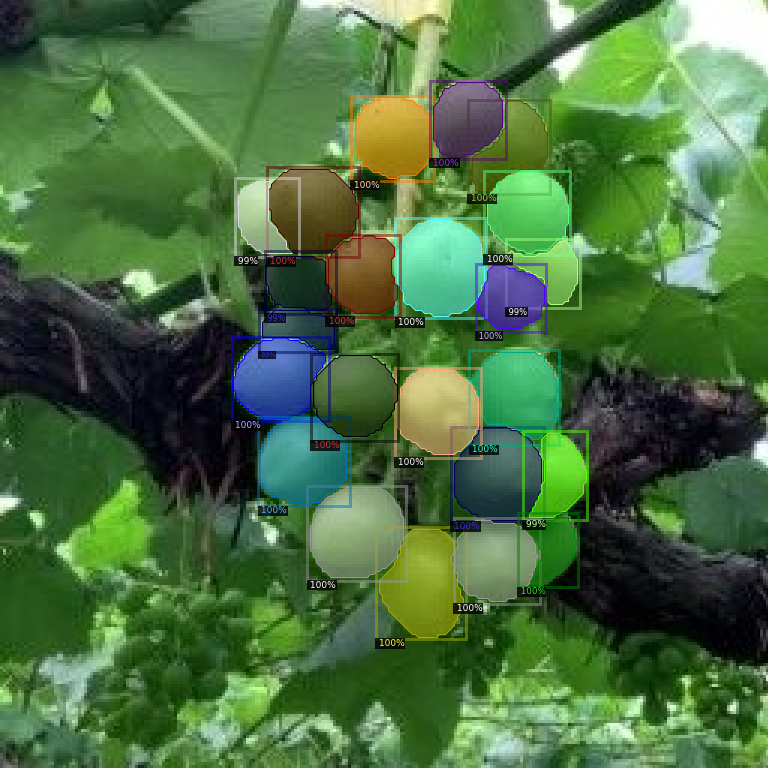

images-diff/val/image_1057.jpg


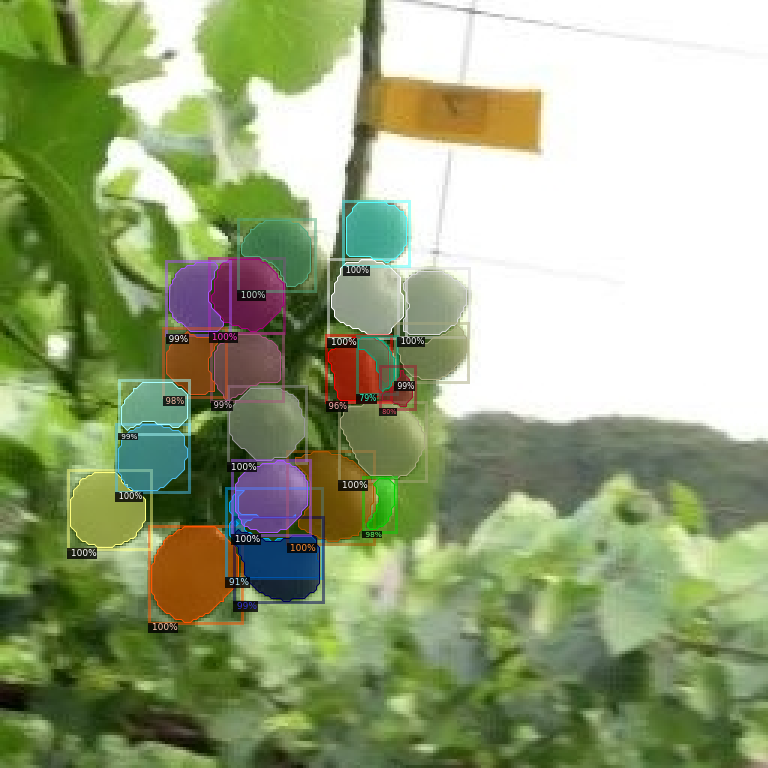

images-diff/val/image_1063.jpg


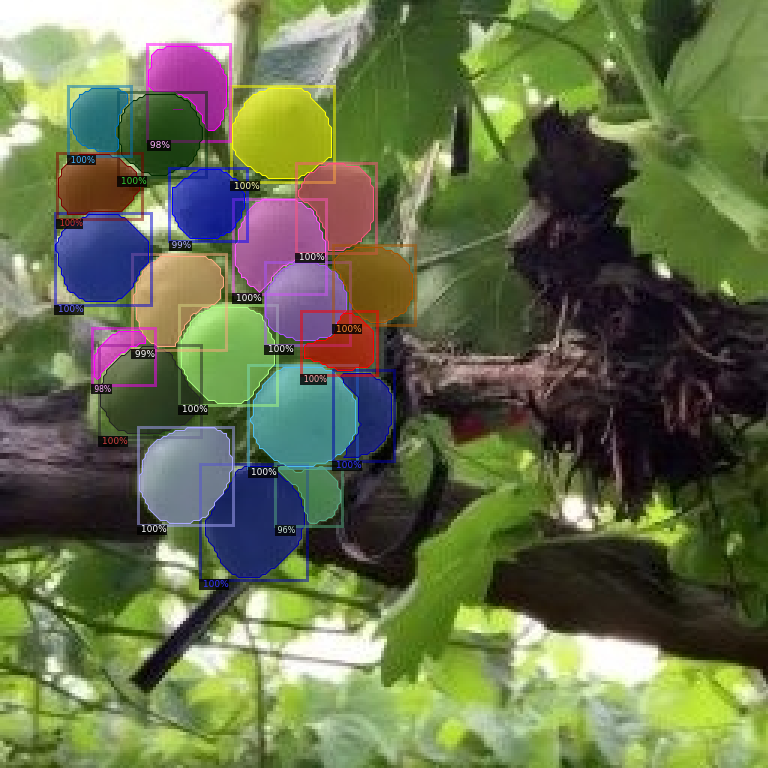

images-diff/val/image_1071.jpg


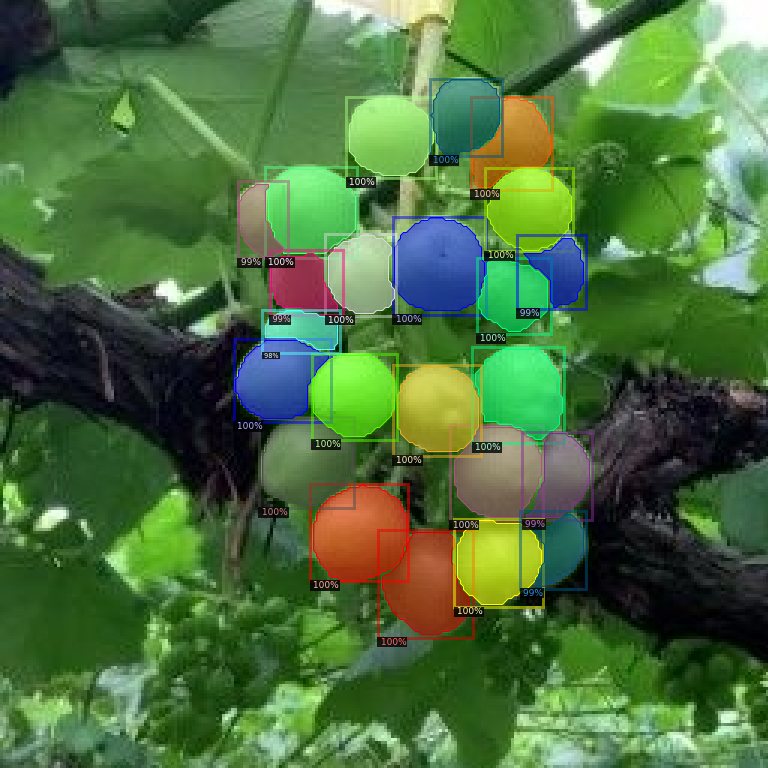

In [9]:
from detectron2.utils.visualizer import ColorMode
grapes_metadata = MetadataCatalog.get("grapes_dataset_val")
dataset_dicts = DatasetCatalog.get("grapes_dataset_val")

#for d in random.sample(dataset_dicts, 12):    
for d in dataset_dicts: 
    im = cv2.imread(d["file_name"])
    print(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=grapes_metadata, 
                   scale=3, 
                   #instance_mode=ColorMode.IMAGE_BW   # は、セグメント化されていないピクセルの色を取り除きます。このオプションは、セグメンテーションモデルでのみ利用可能です。
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [10]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("grapes_dataset_val", output_dir="/output")
val_loader = build_detection_test_loader(cfg, "grapes_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[03/02 10:38:06 d2.data.datasets.coco]: Loaded 12 images in COCO format from images-diff/json_annotation_val.json
[03/02 10:38:06 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|            | 1            |
|            |              |
[03/02 10:38:06 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/02 10:38:06 d2.data.common]: Serializing 12 elements to byte tensors and concatenating them all ...
[03/02 10:38:06 d2.data.common]: Serialized dataset takes 0.00 MiB
[03/02 10:38:06 d2.evaluation.evaluator]: Start inference on 12 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[03/02 10:38:10 d2.evaluation.evaluator]: Inference done 11/12. Dataloading: 0.0015 s/iter. Inference: 0.2869 s/iter. Eval: 0.0054 s/iter. Total: 0.2938 s/iter. ETA=0:00:00
[03/02 10:38:10 d2.evaluation.evaluator]: Total inference time: 0:00:02.114772 (0.302110 s / iter per device, on 1 devices)
[03/02 10:38:10 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.287146 s / iter per device, on 1 devices)
[03/02 10:38:10 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/02 10:38:10 d2.evaluation.coco_evaluation]: Saving results to /output/coco_instances_results.json
[03/02 10:38:10 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[03/02 10:38:10 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[03/02 10:38:10 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[03/02 10:38:10 d2.evaluation.f